# Problem Statement:
A Microfinance Institution (MFI) is an organization that offers financial services to low income populations. 
MFS becomes very useful when targeting especially the unbanked poor families living in remote areas with not much sources of
income. The Microfinance services (MFS) provided by MFI are Group Loans, Agricultural Loans, Individual Business Loans and so on. 

The MFI industry is primarily focusing on low income families and are very useful in such areas, the implementation of MFS has 
been uneven with both significant challenges and successes.

We are working with one such client that is in Telecom Industry.
They are a fixed wireless telecommunications network provider. They have launched various products and have developed its
business and organization based on the budget operator model, offering better products at Lower Prices to all value conscious
customers through a strategy of disruptive innovation that focuses on the subscriber. 

They understand the importance of communication and how it affects a person’s life, thus, focusing on providing their 
services and products to low income families and poor customers that can help them in the need of hour. 

They are collaborating with an MFI to provide micro-credit on mobile balances to be paid back in 5 days. 
The Consumer is believed to be defaulter if he deviates from the path of paying back the loaned amount within the time duration
of 5 days. For the loan amount of 5 (in Indonesian Rupiah), payback amount should be 6 (in Indonesian Rupiah), while, 
for the loan amount of 10 (in Indonesian Rupiah), the payback amount should be 12 (in Indonesian Rupiah). 



Build a model which can be used to predict in terms of a probability for each loan transaction, whether the customer will be 
paying back the loaned amount within 5 days of insurance of loan. In this case, Label ‘1’ indicates that the loan has been 
payed i.e. Non- defaulter, while, Label ‘0’ indicates that the loan has not been payed i.e. defaulter.  

 # Feature Description:
    '''label: Flag indicating whether the user paid back the credit amount within 5 days of issuing the loan{1:success, 0:failure}
    msisdn:	mobile number of user
        aon	:age on cellular network in days
    daily_decr30: Daily amount spent from main account, averaged over last 30 days (in Indonesian Rupiah)
    daily_decr90:  Daily amount spent from main account, averaged over last 90 days (in Indonesian Rupiah)
    rental30:   Average main account balance over last 30 days
    rental90:   Average main account balance over last 90 days
    last_rech_date_ma:   Number of days till last recharge of main account
    last_rech_date_da:   Number of days till last recharge of data account
    last_rech_amt_ma:   Amount of last recharge of main account (in Indonesian Rupiah)
    cnt_ma_rech30:   Number of times main account got recharged in last 30 days
    fr_ma_rech30:   Frequency of main account recharged in last 30 days
    sumamnt_ma_rech30:   Total amount of recharge in main account over last 30 days (in Indonesian Rupiah)
    medianamnt_ma_rech30:   Median of amount of recharges done in main account over last 30 days at user level (in Indonesian Rupiah)
    medianmarechprebal30:    Median of main account balance just before recharge in last 30 days at user level (in Indonesian Rupiah)
    cnt_ma_rech90:   Number of times main account got recharged in last 90 days
    fr_ma_rech90:   Frequency of main account recharged in last 90 days
    sumamnt_ma_rech90:   Total amount of recharge in main account over last 90 days (in Indonasian Rupiah)
    medianamnt_ma_rech90:   Median of amount of recharges done in main account over last 90 days at user level (in Indonasian Rupiah)
    medianmarechprebal90:  Median of main account balance just before recharge in last 90 days at user level (in Indonasian Rupiah)
    cnt_da_rech30:   Number of times data account got recharged in last 30 days
    fr_da_rech30:   Frequency of data account recharged in last 30 days
    cnt_da_rech90:   Number of times data account got recharged in last 90 days
    fr_da_rech90:   Frequency of data account recharged in last 90 days
    cnt_loans30:	Number of loans taken by user in last 30 days
    amnt_loans30:	Total amount of loans taken by user in last 30 days
    maxamnt_loans30:	maximum amount of loan taken by the user in last 30 days
    medianamnt_loans30:	Median of amounts of loan taken by the user in last 30 days
    cnt_loans90:	Number of loans taken by user in last 90 days
    amnt_loans90:	Total amount of loans taken by user in last 90 days
    maxamnt_loans90:	maximum amount of loan taken by the user in last 90 days
    medianamnt_loans90:	Median of amounts of loan taken by the user in last 90 days
    payback30:	Average payback time in days over last 30 days
    payback90:	Average payback time in days over last 90 days
    pcircle:	telecom circle
    pdate:	date'''


In [1]:
# Import Libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split,cross_val_score,GridSearchCV
from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB

from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn .metrics import accuracy_score,classification_report,confusion_matrix,roc_auc_score,roc_curve,f1_score
from sklearn.pipeline import Pipeline  
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.linear_model import LogisticRegression

import warnings
warnings.filterwarnings('ignore')

In [2]:
loan=pd.read_csv('Micro Credit Loan.csv')

In [3]:
# see all the rows and columns

pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns',None)

In [4]:
loan.head()

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
0,1,0,21408I70789,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,UPW,20-07-2016
1,2,1,76462I70374,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,0.0,0.0,0,0,1,12,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,UPW,10-08-2016
2,3,1,17943I70372,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,0.0,0.0,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,19-08-2016
3,4,1,55773I70781,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,UPW,06-06-2016
4,5,1,03813I82730,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,0.0,0.0,0,0,7,42,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,UPW,22-06-2016


Seeing the data we have to build a model which can be used to predict in terms of a probability for each loan transaction, whether the customer will be paying back the loaned amount within 5 days of insurance of loan. In this case, Label ‘1’ indicates that the loan has been payed i.e. Non- defaulter, while, Label ‘0’ indicates that the loan has not been payed i.e. defaulter.

So clearly it is a classification problem.

# Data Inspection

In [5]:
loan.shape
# Total no of rows and columns in the data are 209593 and 37 respectively.

(209593, 37)

In [6]:
loan.columns

Index(['Unnamed: 0', 'label', 'msisdn', 'aon', 'daily_decr30', 'daily_decr90',
       'rental30', 'rental90', 'last_rech_date_ma', 'last_rech_date_da',
       'last_rech_amt_ma', 'cnt_ma_rech30', 'fr_ma_rech30',
       'sumamnt_ma_rech30', 'medianamnt_ma_rech30', 'medianmarechprebal30',
       'cnt_ma_rech90', 'fr_ma_rech90', 'sumamnt_ma_rech90',
       'medianamnt_ma_rech90', 'medianmarechprebal90', 'cnt_da_rech30',
       'fr_da_rech30', 'cnt_da_rech90', 'fr_da_rech90', 'cnt_loans30',
       'amnt_loans30', 'maxamnt_loans30', 'medianamnt_loans30', 'cnt_loans90',
       'amnt_loans90', 'maxamnt_loans90', 'medianamnt_loans90', 'payback30',
       'payback90', 'pcircle', 'pdate'],
      dtype='object')

In [7]:
loan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209593 entries, 0 to 209592
Data columns (total 37 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Unnamed: 0            209593 non-null  int64  
 1   label                 209593 non-null  int64  
 2   msisdn                209593 non-null  object 
 3   aon                   209593 non-null  float64
 4   daily_decr30          209593 non-null  float64
 5   daily_decr90          209593 non-null  float64
 6   rental30              209593 non-null  float64
 7   rental90              209593 non-null  float64
 8   last_rech_date_ma     209593 non-null  float64
 9   last_rech_date_da     209593 non-null  float64
 10  last_rech_amt_ma      209593 non-null  int64  
 11  cnt_ma_rech30         209593 non-null  int64  
 12  fr_ma_rech30          209593 non-null  float64
 13  sumamnt_ma_rech30     209593 non-null  float64
 14  medianamnt_ma_rech30  209593 non-null  float64
 15  

1. The data seems to be a combination of both numerical and categorical features. 
2. msisdn,pcircle,pdate are categorical and rest features are numerical in type.


In [8]:
loan.isnull().sum()

Unnamed: 0              0
label                   0
msisdn                  0
aon                     0
daily_decr30            0
daily_decr90            0
rental30                0
rental90                0
last_rech_date_ma       0
last_rech_date_da       0
last_rech_amt_ma        0
cnt_ma_rech30           0
fr_ma_rech30            0
sumamnt_ma_rech30       0
medianamnt_ma_rech30    0
medianmarechprebal30    0
cnt_ma_rech90           0
fr_ma_rech90            0
sumamnt_ma_rech90       0
medianamnt_ma_rech90    0
medianmarechprebal90    0
cnt_da_rech30           0
fr_da_rech30            0
cnt_da_rech90           0
fr_da_rech90            0
cnt_loans30             0
amnt_loans30            0
maxamnt_loans30         0
medianamnt_loans30      0
cnt_loans90             0
amnt_loans90            0
maxamnt_loans90         0
medianamnt_loans90      0
payback30               0
payback90               0
pcircle                 0
pdate                   0
dtype: int64

There are no null values in the dataset

In [9]:
#See the percentage of label distribution

loan['label'].value_counts()/loan.shape[0]*100

1    87.517713
0    12.482287
Name: label, dtype: float64

1. The data seems to be imbalance in nature.
2. Only 12.48% of data says that the cunsumer wont eligible for the credit.

In [10]:
# lets look upon the skewness of the data
loan.agg(['skew','kurtosis']).T

,skew,kurtosis
Unnamed: 0,0.000000,-1.200000
label,-2.270254,3.154082
aon,10.392949,109.258003
daily_decr30,3.946230,30.971987
daily_decr90,4.252565,35.752305
rental30,4.521929,58.721169
rental90,4.437681,46.884796
last_rech_date_ma,14.790974,223.251362
last_rech_date_da,14.814857,224.267170
last_rech_amt_ma,3.781149,41.318834


 Seems that except label feature all other features are highly positively skewed.

In [11]:
loan.describe(include='all')

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
count,209593.000000,209593.000000,209593,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.00000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.00000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593,209593
unique,NaN,NaN,186243,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,82
top,NaN,NaN,04581I85330,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,UPW,04-07-2016
freq,NaN,NaN,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,209593,3150
mean,104797.000000,0.875177,NaN,8112.343445,5381.402289,6082.515068,2692.581910,3483.406534,3755.84780,3712.202921,2064.452797,3.978057,3737.355121,7704.501157,1812.817952,3851.927942,6.31543,7.716780,12396.218352,1864.595821,92.025541,262.578110,3749.494447,0.041495,0.045712,2.758981,17.952021,274.658747,0.054029,18.520919,23.645398,6.703134,0.046077,3.398826,4.321485,NaN,NaN
std,60504.431823,0.330519,NaN,75696.082531,9220.623400,10918.812767,4308.586781,5770.461279,53905.89223,53374.833430,2370.786034,4.256090,53643.625172,10139.621714,2070.864620,54006.374433,7.19347,12.590251,16857.793882,2081.680664,369.215658,4183.897978,53885.414979,0.397556,0.951386,2.554502,17.379741,4245.264648,0.218039,224.797423,26.469861,2.103864,0.200692,8.813729,10.308108,NaN,NaN
min,1.000000,0.000000,NaN,-48.000000,-93.012667,-93.012667,-23737.140000,-24720.580000,-29.00000,-29.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-200.000000,0.00000,0.000000,0.000000,0.000000,-200.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN
25%,52399.000000,1.000000,NaN,246.000000,42.440000,42.692000,280.420000,300.260000,1.00000,0.000000,770.000000,1.000000,0.000000,1540.000000,770.000000,11.000000,2.00000,0.000000,2317.000000,773.000000,14.600000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,6.000000,0.000000,1.000000,6.000000,6.000000,0.000000,0.000000,0.000000,NaN,NaN
50%,104797.000000,1.000000,NaN,527.000000,1469.175667,1500.000000,1083.570000,1334.000000,3.00000,0.000000,1539.000000,3.000000,2.000000,4628.000000,1539.000000,33.900000,4.00000,2.000000,7226.000000,1539.000000,36.000000,0.000000,0.000000,0.000000,0.000000,2.000000,12.000000,6.000000,0.000000,2.000000,12.000000,6.000000,0.000000,0.000000,1.666667,NaN,NaN
75%,157195.000000,1.000000,NaN,982.000000,7244.000000,7802.790000,3356.940000,4201.790000,7.00000,0.000000,2309.000000,5.000000,6.000000,10010.000000,1924.000000,83.000000,8.00000,8.000000,16000.000000,1924.000000,79.310000,0.000000,0.000000,0.000000,0.000000,4.000000,24.000000,6.000000,0.000000,5.000000,30.000000,6.000000,0.000000,3.750000,4.500000,NaN,NaN


1. There are some unnatural values in the dataset.
2. There are also some ouliers in the dataset.
3. Label data is highly imbalanced.
4. We can also see some negetive values in age column which is absolutely impossible.

# Exploratory Data Analysis of original data

In [12]:
loan.drop('Unnamed: 0',axis=1,inplace=True) 
# Unnamed 0 cloumn doesnot hold any meaning so better to drop the feature

In [13]:
numerical=[feature for feature in loan.columns if loan[feature].dtype!='O']
print(len(numerical))
numerical

33


['label',
 'aon',
 'daily_decr30',
 'daily_decr90',
 'rental30',
 'rental90',
 'last_rech_date_ma',
 'last_rech_date_da',
 'last_rech_amt_ma',
 'cnt_ma_rech30',
 'fr_ma_rech30',
 'sumamnt_ma_rech30',
 'medianamnt_ma_rech30',
 'medianmarechprebal30',
 'cnt_ma_rech90',
 'fr_ma_rech90',
 'sumamnt_ma_rech90',
 'medianamnt_ma_rech90',
 'medianmarechprebal90',
 'cnt_da_rech30',
 'fr_da_rech30',
 'cnt_da_rech90',
 'fr_da_rech90',
 'cnt_loans30',
 'amnt_loans30',
 'maxamnt_loans30',
 'medianamnt_loans30',
 'cnt_loans90',
 'amnt_loans90',
 'maxamnt_loans90',
 'medianamnt_loans90',
 'payback30',
 'payback90']

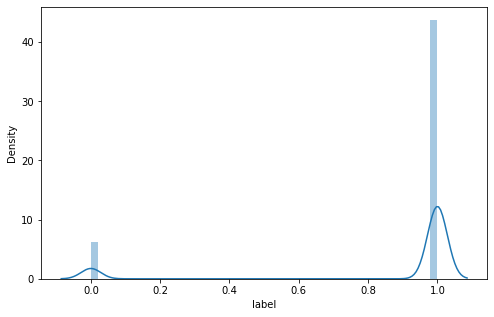

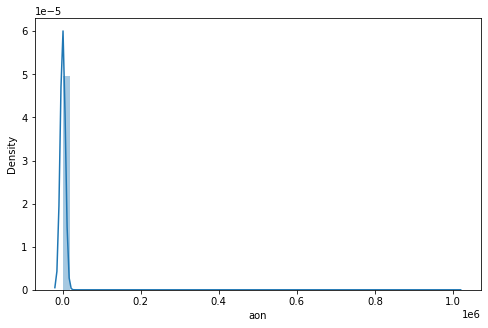

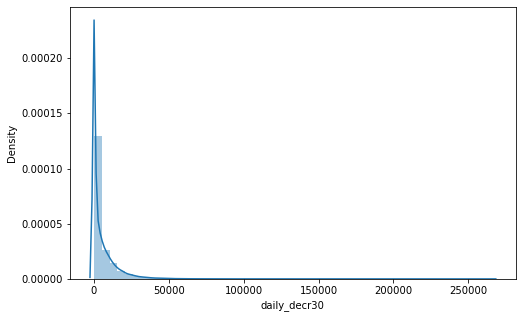

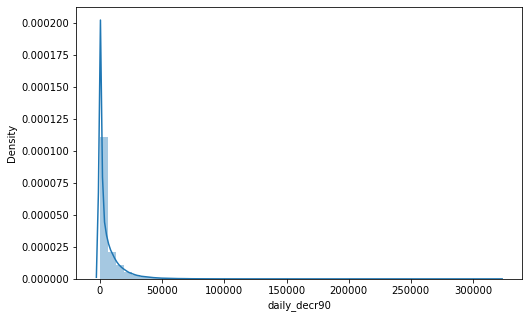

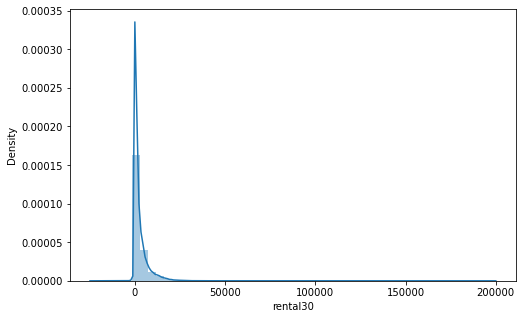

...

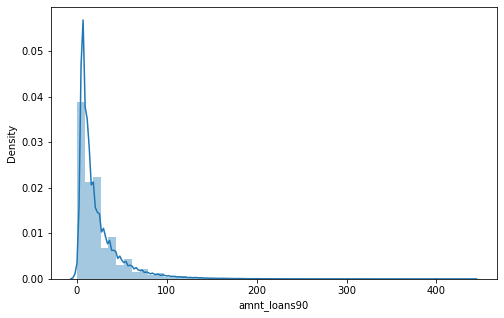

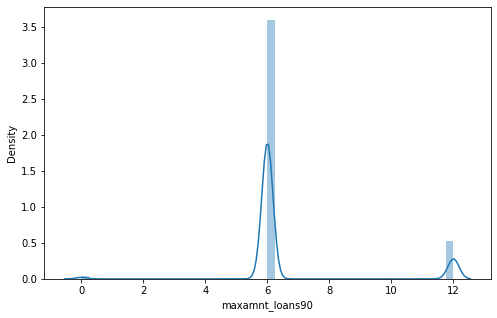

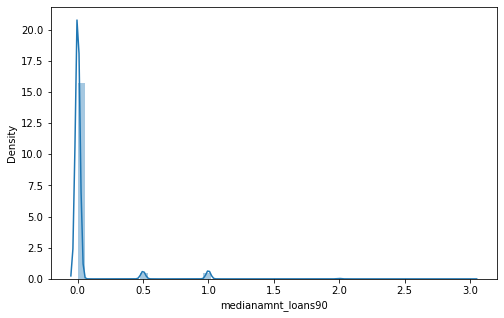

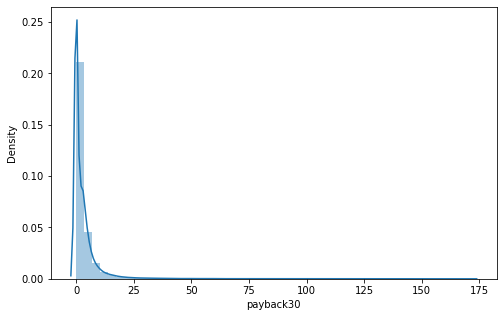

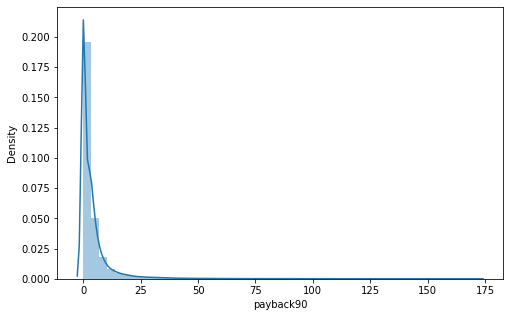

In [14]:
# we will look at how all the features is effecting the prediction

for i in numerical:
    plt.figure(figsize=(8,5))
    sns.distplot(loan[i])
    plt.show()

Observation:
1. Our target variable is highly imbalanced.
2. Almost all features are left skewed with high no.of outliers.

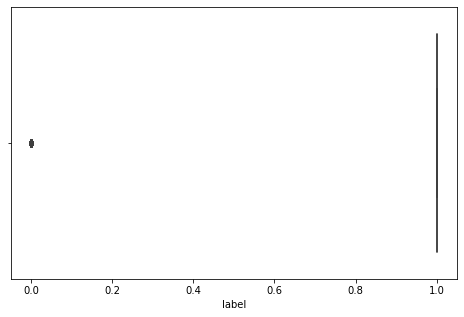

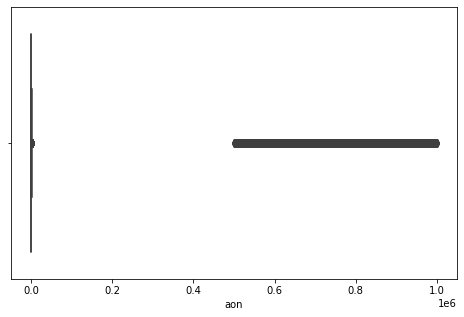

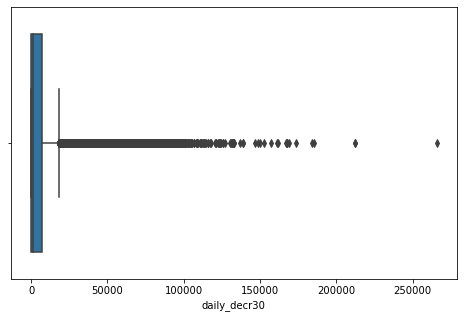

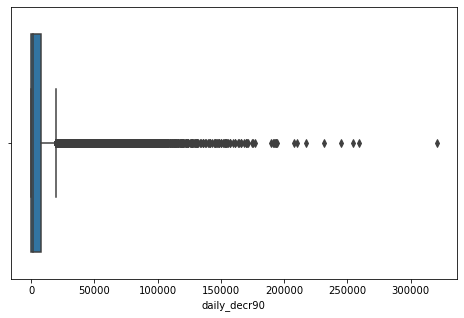

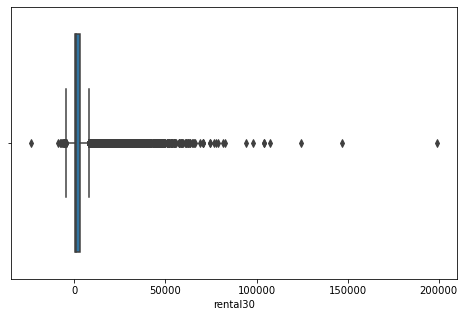

...

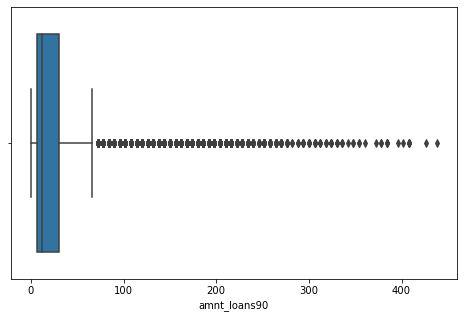

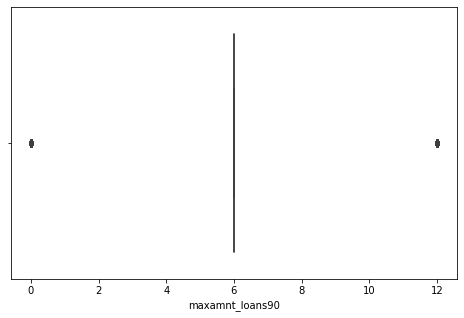

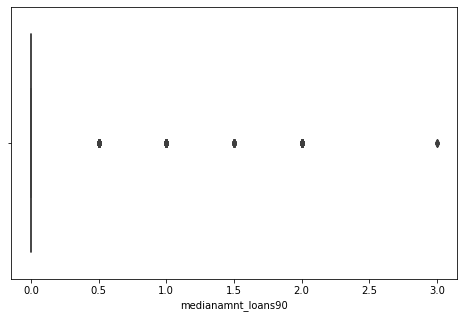

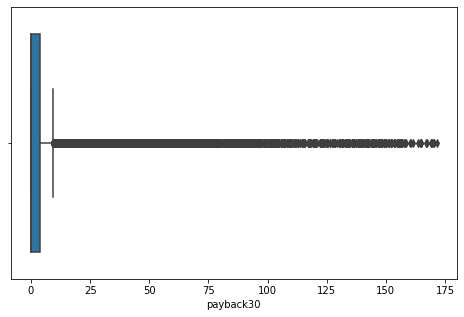

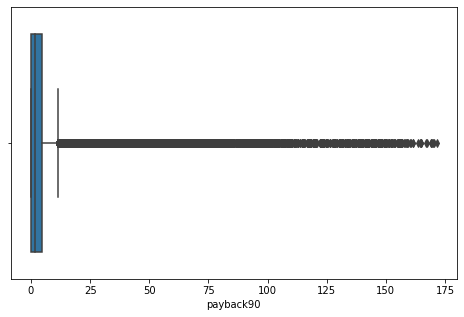

In [15]:
# Plotting for numerical variables:

for i in numerical:
    plt.figure(figsize=(8,5))
    sns.boxplot(loan[i])
    plt.show()

Almost all features are having outliers . Some are treated as its important to treat them for training the model but also some are left unhandled as its normal to have such outliers.

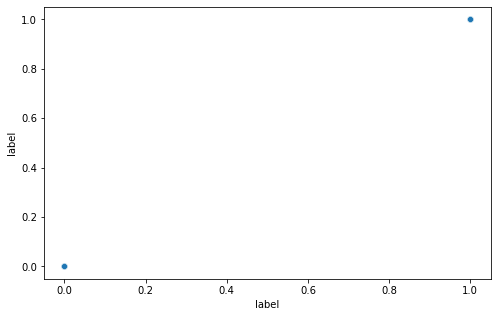

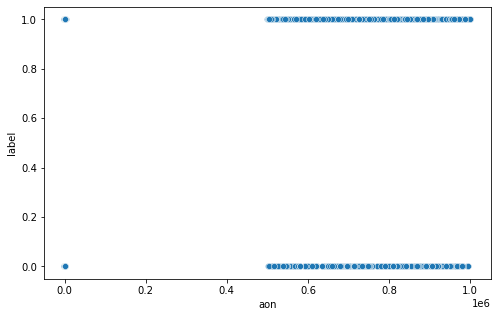

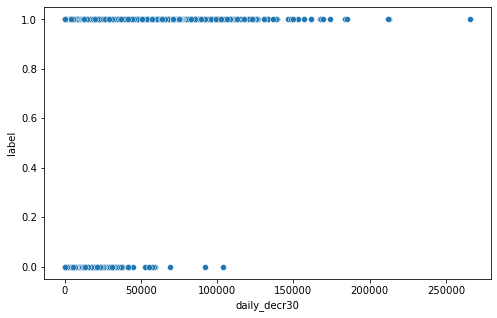

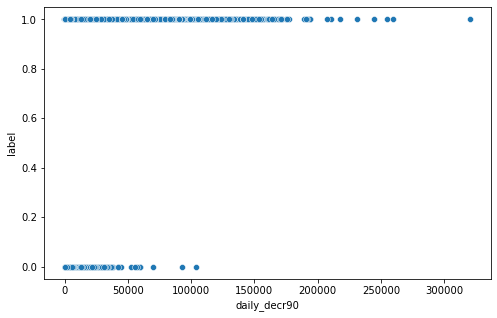

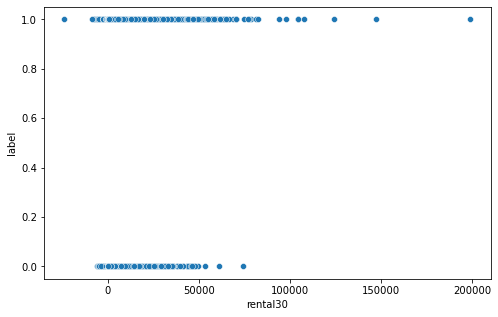

...

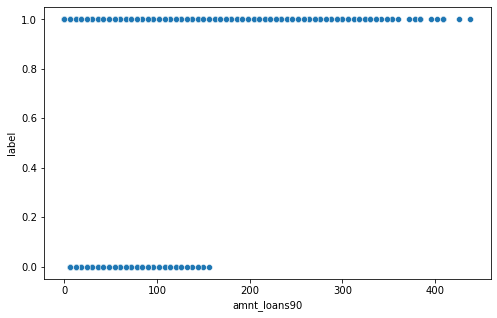

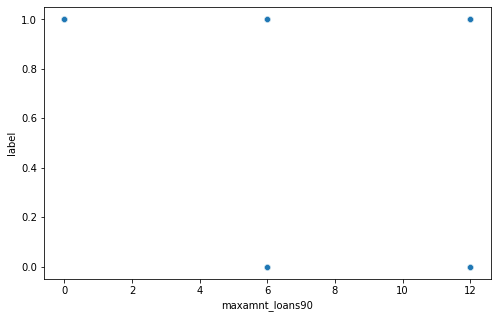

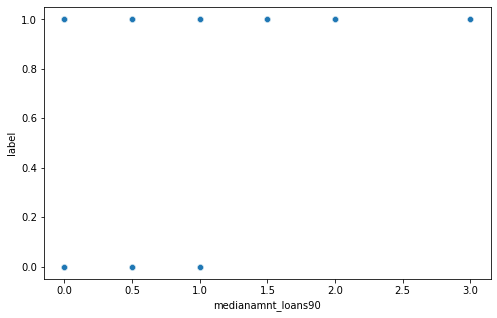

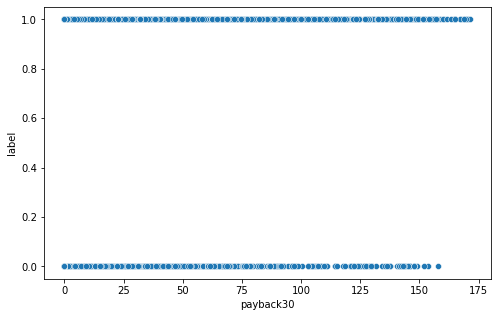

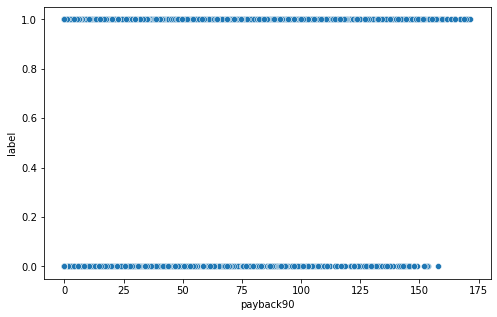

In [16]:

for i in numerical:
    plt.figure(figsize=(8,5))
    sns.scatterplot(x=loan[i],y=loan.label)
   #plt.title('Gender Vs Loan status')

In [17]:
categorical=[feature for feature in loan.columns if loan[feature].dtype=='O']
print(len(categorical))
categorical

3


['msisdn', 'pcircle', 'pdate']

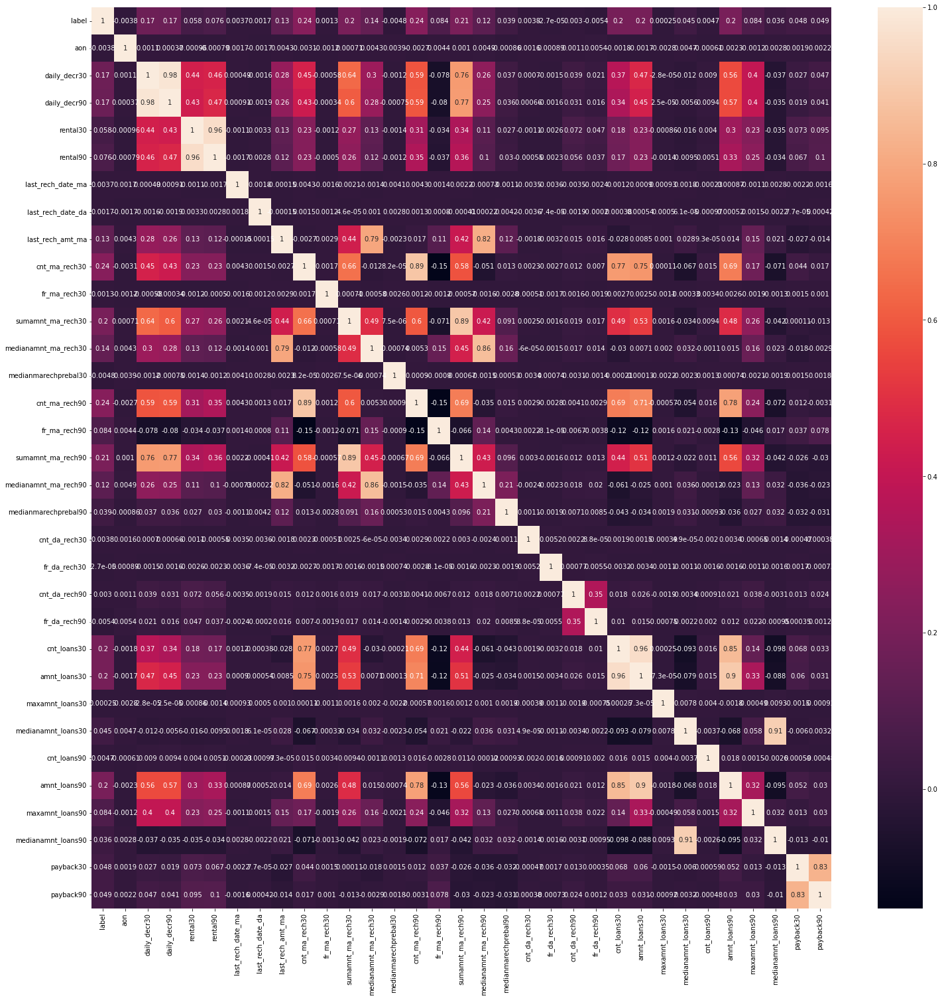

In [18]:
# See the correlation between the features:

plt.figure(figsize=(25,25))
sns.heatmap(loan.corr(),annot=True )
plt.show()

Observation:
1. The payback30 and payback90 show strong negative correlation with the target variable 'label'.
2. Rental30 and rental90 are hioghly correlated to daily_dec30 and daily_dec90.
3. amt_loan 30 and amt_loan 90 are strongly correlated.
4. cnt_amt30 and amt_loan30 are also strongly correlated.
5. medianamnt30 and medianamnt90 are highly correlated to each other.
6. Also some of the features such as amt_ma_rech30,amt_ma_rech90,cnt_ma_reach30 and cnt_ma_rech90 and cntda_reach30 and cnt_da_reach90 are mildly correlated.


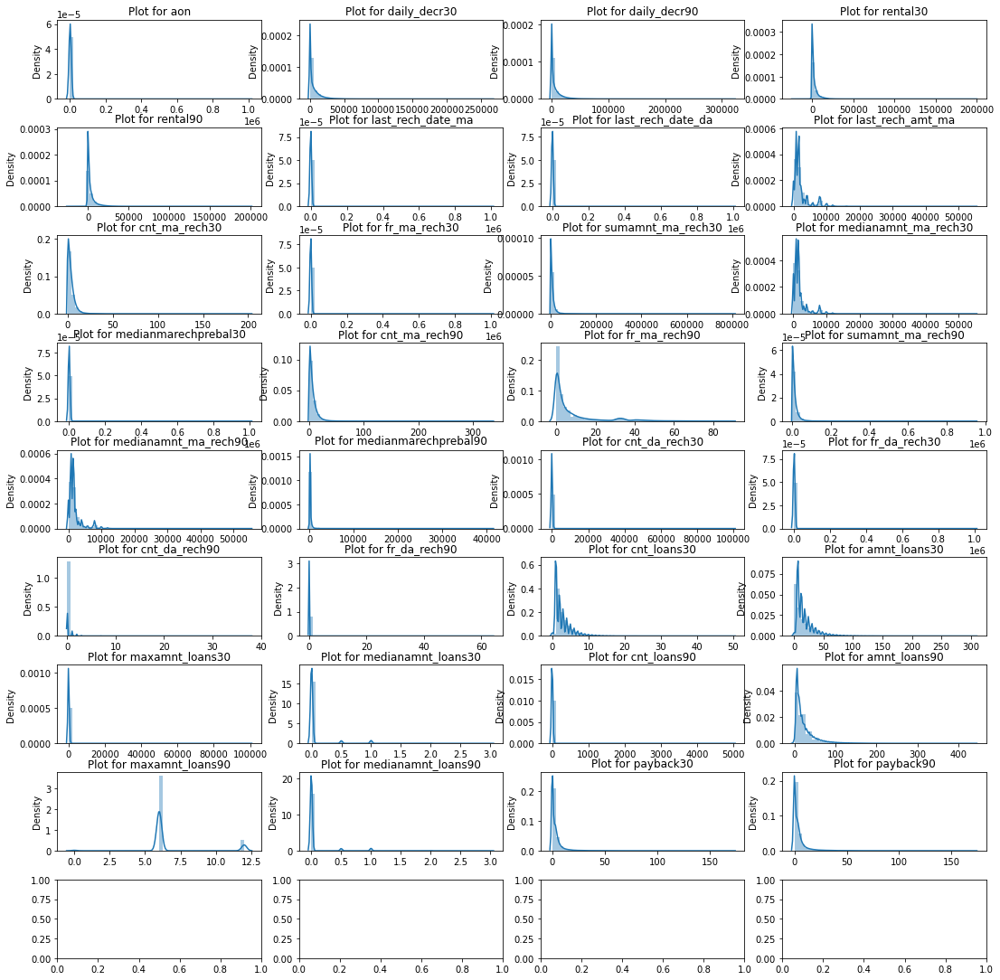

In [19]:
f,ax = plt.subplots(9,4,figsize=(15,15))
f.tight_layout()

i,j = 0,0
for col in loan.iloc[:,2:-2].columns:
    graph = sns.distplot(loan[col], ax=ax[i,j])
    graph.set(xlabel=None)
    ax[i,j].set_title(f'Plot for {col}')
    
    j+=1
    if j%4==0:
        i+=1
        j=0

# Data Cleaning

In [20]:
clean_loan=loan.copy()

In [21]:
clean_loan.head()

,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
0,0,21408I70789,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,UPW,20-07-2016
1,1,76462I70374,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,0.0,0.0,0,0,1,12,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,UPW,10-08-2016
2,1,17943I70372,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,0.0,0.0,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,19-08-2016
3,1,55773I70781,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,UPW,06-06-2016
4,1,03813I82730,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,0.0,0.0,0,0,7,42,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,UPW,22-06-2016


1. msisdn is having a character I which needs to be treated.
2. aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,medianmarechprebal30,
    medianmarechprebal90 columns are having negetive values which needs to be treated.


In [22]:
clean_loan.shape

(209593, 36)

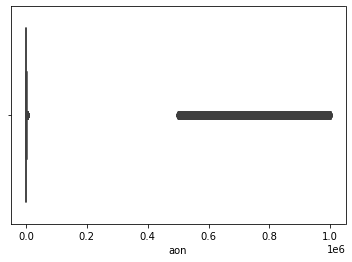

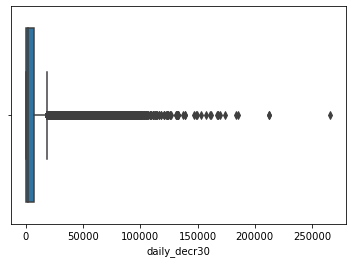

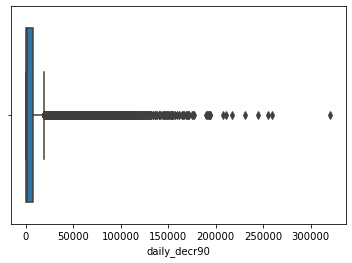

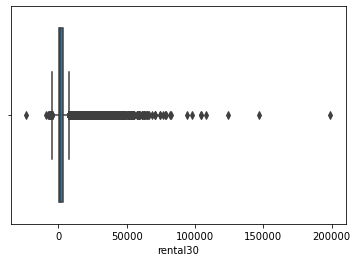

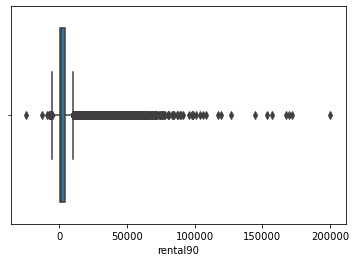

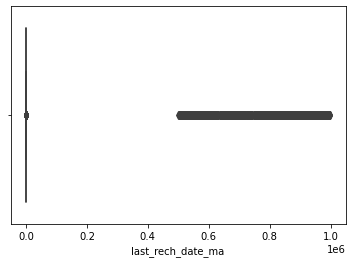

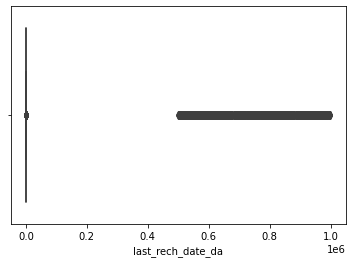

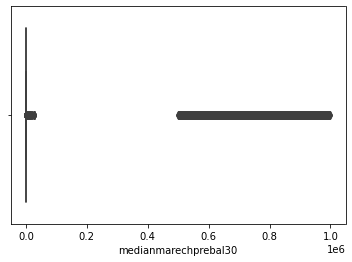

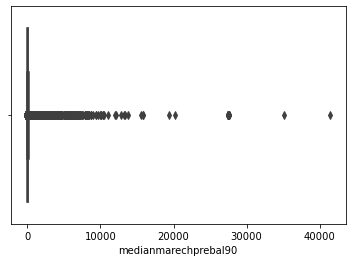

In [23]:
# Lets check upon the outliers whicxh needs to be checked before data visualization. 
neg_min=['aon','daily_decr30','daily_decr90','rental30','rental90','last_rech_date_ma','last_rech_date_da','medianmarechprebal30',
         'medianmarechprebal90']
for i in neg_min:
    sns.boxplot(clean_loan[i])
    plt.show()

Much of outliers is seen which needs to be managed.


In [24]:
# The phone was having an unwanted value I which needsto be treated also the datatype is being changed

def treat_msisdn(x):
    return x.replace("I","")

In [25]:
clean_loan['msisdn'] = clean_loan['msisdn'].apply(treat_msisdn).astype('int64')

In [26]:
clean_loan[['msisdn']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209593 entries, 0 to 209592
Data columns (total 1 columns):
 #   Column  Non-Null Count   Dtype
---  ------  --------------   -----
 0   msisdn  209593 non-null  int64
dtypes: int64(1)
memory usage: 1.6 MB


In [27]:
#loan['msisdn'].value_counts()

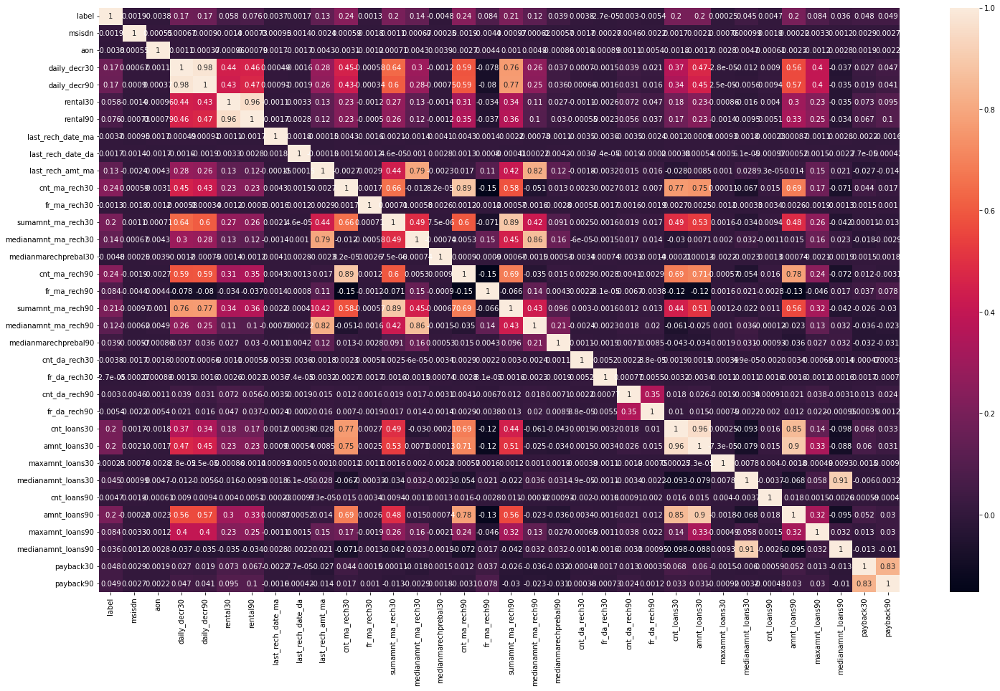

In [28]:
# See the correlation between the features:


plt.figure(figsize=(25,15))
sns.heatmap(clean_loan.corr(),annot=True )
plt.show()

Observation:




In [29]:
# Treating pcircle


clean_loan['pcircle'].value_counts()

UPW    209593
Name: pcircle, dtype: int64

In [30]:
# Only one type on value for pcircle hence we can drop the feature

clean_loan.drop('pcircle',axis=1,inplace=True)

In [31]:
# Lets handle 'aon'

print(clean_loan[clean_loan['aon'] < 0].shape)
print(clean_loan[clean_loan['aon'] >10000].shape)

(1539, 35)
(2089, 35)


 1. There are 1539 negetive values.
 2. Also having large positive values.
 3. The above prediction says that both the conditions are actually not posible.
 

In [32]:
def clean_aon(x):
    if x > 10000:
        return x//1440
    elif x < 0:
        return -x
    else:
        return x

In [33]:
clean_loan['aon'] = clean_loan['aon'].apply(clean_aon)
clean_loan['aon'] = round(clean_loan['aon'])

In [34]:
clean_loan['aon'].min(), clean_loan['aon'].max()
# aon is handled now

(1.0, 2440.0)

In [35]:
8112.0/365

22.224657534246575

In [36]:
clean_loan['aon'] = clean_loan['aon'].astype('int')

<AxesSubplot:>

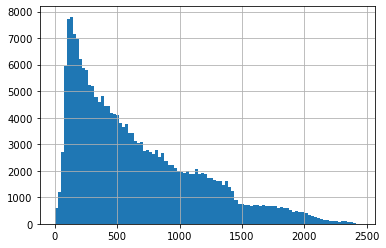

In [37]:
clean_loan['aon'].hist(bins=100)

In [38]:
# lets treat daily_decr30
clean_loan['daily_decr30'].describe()


count    209593.000000
mean       5381.402289
std        9220.623400
min         -93.012667
25%          42.440000
50%        1469.175667
75%        7244.000000
max      265926.000000
Name: daily_decr30, dtype: float64

In [39]:
clean_loan[clean_loan['daily_decr30'] < 0].shape

(1839, 35)

In [40]:
clean_loan[clean_loan['daily_decr30'] < 0]['daily_decr30'].max()

-0.000666667

1. The 'daily_decr30' is the Daily amount spent from main account, averaged over last 30 day in Rs.
2. Amount spent cannot be in negative since its the amount spent and not the balance. Hence I am going to remove the negative   signs from the values considering that those negative signs are a data entry error.
3. There are some extreme large values. For example the max value 265926. We cannot consider these as invalid because these could be just natural outliers.

In [41]:
clean_loan[clean_loan['daily_decr30']> 81874]['label'].value_counts()

1    208
0      2
Name: label, dtype: int64

In [42]:
Q3 = clean_loan['daily_decr30'].quantile(0.75)
Q1 = clean_loan['daily_decr30'].quantile(0.25)
IQR = Q3 - Q1
print(f"Lower bound: {Q1 - (IQR*3)}, \n1st Quantile: {Q1}, \nIQR: {IQR}, \n3rd Quantile: {Q3}, \nUpper bound: {Q3 + (IQR*3)}")

Lower bound: -21562.24, 
1st Quantile: 42.44, 
IQR: 7201.56, 
3rd Quantile: 7244.0, 
Upper bound: 28848.68


In [43]:
clean_loan[clean_loan['daily_decr30']> 28848.68]['label'].value_counts()

1    5840
0      45
Name: label, dtype: int64

<AxesSubplot:>

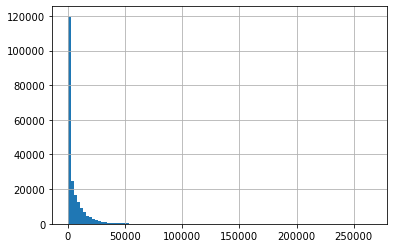

In [44]:
clean_loan['daily_decr30'].hist(bins=100)

In [45]:
print(f"About {round(100*clean_loan[clean_loan['daily_decr30']> 28848].shape[0]/clean_loan.shape[0],2)} % data are outliers.")

About 2.81 % data are outliers.


The negative values are errors. I will remove the negative sign from it to make it positive
The large positive values are extreme outliers. However these could be natural outlier so may not be treated now.

In [46]:
# Create a function to handle the negetive values
def clean_daily_decr(x):
    if x < 0:
        return -x
    else:
        return x

In [47]:
# see the min and max value of 'daily_decr30'
clean_loan['daily_decr30'] = clean_loan['daily_decr30'].apply(clean_daily_decr)
clean_loan['daily_decr30'].min(),clean_loan['daily_decr30'].max()


(0.0, 265926.0)

In [48]:
# see the min and max value of 'daily_decr90'

clean_loan['daily_decr90'] = clean_loan['daily_decr90'].apply(clean_daily_decr)
clean_loan['daily_decr90'].min(),clean_loan['daily_decr90'].max()

(0.0, 320630.0)

1. Similar to daily_decr30, the daily_decr90 also have negative values and some extreme positive values.
2. I will remove the negative signs from the values since these are amounts spen

array([[<AxesSubplot:title={'center':'rental30'}>]], dtype=object)

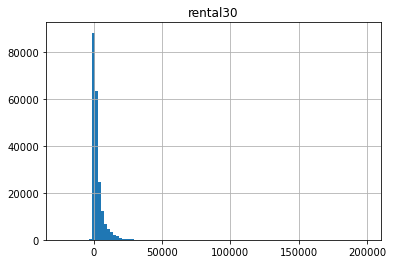

In [49]:
# Handle rental30 and rental90

clean_loan[['rental30']].hist(bins=100)


1. The account balance can be negative however, it depends on the credit limit allowed by the Business.
2. There are some extreme negative and positive values. These could be natural outliers depending on the credit limit.

array([[<AxesSubplot:title={'center':'rental90'}>]], dtype=object)

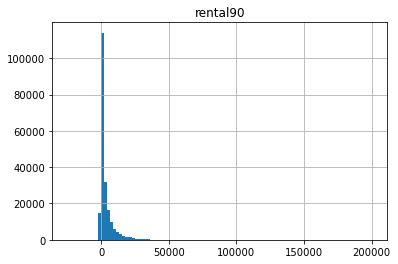

In [50]:
clean_loan[['rental90']].hist(bins=100)

# The account balance can be negative however, it depends on the credit limit allowed by the Business.
# There are some extreme negative and positive values. These could be natural outliers depending on the credit limit.

In [51]:
# Treat the 'last_rech_date_ma'
clean_loan['last_rech_date_ma'].describe()

count    209593.00000
mean       3755.84780
std       53905.89223
min         -29.00000
25%           1.00000
50%           3.00000
75%           7.00000
max      998650.37770
Name: last_rech_date_ma, dtype: float64

In [52]:
998650.377700/365

2736.0284320547944

1. From above its clearly seen that last recharge date cannot be negative.
2. also if we see the max value its coming to be 2736 years which is absolutely impossible.
3. 50% vlues arev between 1 to 7 which seems to be realistic.

In [53]:
clean_loan[clean_loan['last_rech_date_ma'] > 150]['last_rech_date_ma'].min()

500152.7257

In [54]:
# converting min to days

998650.377700/1440

693.5072067361111

In [55]:
# Defining a function to remove negative sign
def clean_last_rech_date_ma(x):
    if x < 0:
        return -x
    elif x > 150:
        return x // 86400
    else:
        return x

In [56]:
clean_loan['last_rech_date_ma'].min(), clean_loan[['last_rech_date_ma']].max()

(-29.0,
 last_rech_date_ma    998650.3777
 dtype: float64)

In [57]:
clean_loan['last_rech_date_ma'] = clean_loan['last_rech_date_ma'].apply(clean_last_rech_date_ma).astype('int')
clean_loan['last_rech_date_ma'].min(), clean_loan[['last_rech_date_ma']].max()


(0,
 last_rech_date_ma    113
 dtype: int32)

array([[<AxesSubplot:title={'center':'last_rech_date_ma'}>]], dtype=object)

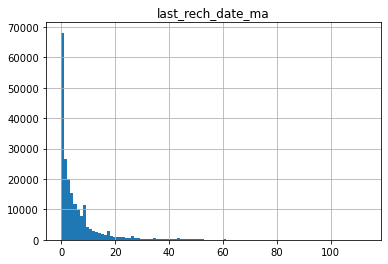

In [58]:
clean_loan[['last_rech_date_ma']].hist(bins=100) 

# Graph showing after handling the outliers

In [59]:
# Treat the 'last_rech_date_da'
clean_loan['last_rech_date_da'].describe()


# 50% of value is 0
# lets remove the negative sign


count    209593.000000
mean       3712.202921
std       53374.833430
min         -29.000000
25%           0.000000
50%           0.000000
75%           0.000000
max      999171.809400
Name: last_rech_date_da, dtype: float64

In [60]:
clean_loan['last_rech_date_da'].min(), clean_loan[['last_rech_date_da']].max()

(-29.0,
 last_rech_date_da    999171.8094
 dtype: float64)

In [61]:
clean_loan['last_rech_date_da'] = clean_loan['last_rech_date_da'].apply(clean_last_rech_date_ma).astype('int')
clean_loan['last_rech_date_da'].min(), clean_loan[['last_rech_date_da']].max()


(0,
 last_rech_date_da    115
 dtype: int32)

array([[<AxesSubplot:title={'center':'last_rech_date_da'}>]], dtype=object)

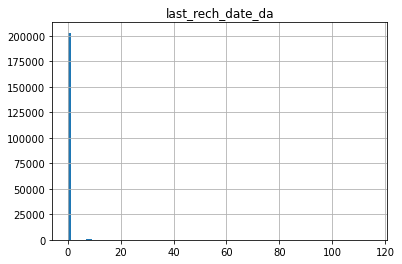

In [62]:
clean_loan[['last_rech_date_da']].hist(bins=100) 

# Graph showing after handling the outliers

In [63]:
# Treat last_rech_amt_ma

clean_loan['last_rech_amt_ma'].describe()

count    209593.000000
mean       2064.452797
std        2370.786034
min           0.000000
25%         770.000000
50%        1539.000000
75%        2309.000000
max       55000.000000
Name: last_rech_amt_ma, dtype: float64

1. There are positive outliers in the data.
2. There is no information about any limit on the recharge amount. These could be natural outliers. Hence, I am leaving 

In [64]:
# Handle 'cnt_ma_rech30' ,'cnt_ma_rech90','cnt_da_rech30', 'cnt_da_rech90'
clean_loan[['cnt_ma_rech30','cnt_ma_rech90','cnt_da_rech30','cnt_da_rech90']].describe()


,cnt_ma_rech30,cnt_ma_rech90,cnt_da_rech30,cnt_da_rech90
count,209593.000000,209593.00000,209593.000000,209593.000000
mean,3.978057,6.31543,262.578110,0.041495
std,4.256090,7.19347,4183.897978,0.397556
min,0.000000,0.00000,0.000000,0.000000
25%,1.000000,2.00000,0.000000,0.000000
50%,3.000000,4.00000,0.000000,0.000000
75%,5.000000,8.00000,0.000000,0.000000
max,203.000000,336.00000,99914.441420,38.000000


1. Main account limit is not given so the account can bev recharged with any amount of money hence the outliers are neglected.
2. Positive ouliers could be neglected.
3. But if we look upon data recharge it cant be more in 30 days than in 90 days.
4. So the outliers of cnt_da_rech30 should be handled usind normalization i.e either sqrt or cbrt.

In [65]:
clean_loan['cnt_da_rech30']=round(np.cbrt(clean_loan['cnt_da_rech30']))

In [66]:
clean_loan['cnt_da_rech30'].describe()

count    209593.000000
mean          0.195422
std           2.595527
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max          46.000000
Name: cnt_da_rech30, dtype: float64

In [67]:
clean_loan['cnt_da_rech90']=round(np.cbrt(clean_loan['cnt_da_rech90']))
clean_loan['cnt_da_rech90'].describe()

count    209593.000000
mean          0.027644
std           0.176372
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           3.000000
Name: cnt_da_rech90, dtype: float64

In [68]:
clean_loan[clean_loan['cnt_da_rech30'] > clean_loan['cnt_da_rech90']]

,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pdate
112,1,1880988648,131,948.816667,950.500000,1969.49,2015.51,1,0,1539,3,5.0000,4617.0,1539.0,21.0000,5,1,6937,1539.0,23.000,31.0,0.0000,0.0,0,1,6,6.000000,0.0,2.000000,12,6,0.0,0.000000,1.000000,01-07-2016
121,1,2124188689,1162,56.666667,56.666667,398.14,398.14,1,0,1539,8,1.0000,7104.0,770.0,64.1700,9,1,8051,770.0,59.170,45.0,0.0000,0.0,0,6,36,6.000000,0.0,2340.280120,36,6,0.0,5.500000,5.500000,17-06-2016
1490,0,9725890584,1236,4115.220667,4130.330000,1710.40,3093.92,5,0,1539,3,3.0000,3848.0,1539.0,2.0000,3,3,3848,1539.0,2.000,22.0,0.0000,0.0,0,2,12,6.000000,0.0,2.000000,12,6,0.0,0.000000,0.000000,16-07-2016
1536,1,6945390583,188,94.400000,94.400000,3542.50,3542.50,4,0,4048,5,2.0000,10982.0,1547.0,19.0000,5,2,10982,1547.0,19.000,46.0,0.0000,0.0,0,4,24,6.000000,0.0,4.000000,24,6,0.0,6.000000,6.000000,25-06-2016
2114,1,5827390840,754,8653.260000,8682.600000,887.64,3480.72,1,0,770,2,21.0000,2309.0,1154.5,34.9700,3,9,6357,1539.0,28.470,37.0,0.0000,0.0,0,3,18,6.000000,0.0,4.000000,24,6,0.0,5.500000,5.666667,27-07-2016
2828,1,833490580,395,2868.052000,2884.360000,2202.78,2390.25,3,0,1539,3,7.0000,5395.0,1547.0,49.0000,8,7,11920,1543.0,65.500,33.0,0.0000,0.0,0,3,18,6.000000,0.0,5.000000,30,6,0.0,7.000000,6.500000,09-07-2016
2895,1,3783185350,145,3300.000000,3904.600000,200.13,299.69,13,0,1539,1,0.0000,1539.0,1539.0,3.0000,2,22,2309,1154.5,18.000,27.0,0.0000,0.0,0,1,6,6.000000,0.0,1.000000,6,6,0.0,0.000000,0.000000,09-08-2016
2907,1,7480485320,599,5794.618000,5838.060000,620.07,784.50,9,0,1924,4,11.0000,5003.0,1154.5,25.5000,11,1,10408,773.0,16.500,37.0,0.0000,0.0,0,3,18,6.000000,0.0,7.000000,42,6,0.0,6.666667,6.285714,21-07-2016
2987,1,9605389238,698,38.319667,38.319667,143.39,143.39,1,0,1539,5,6.0000,7703.0,1539.0,19.5000,5,6,7703,1539.0,19.500,43.0,0.0000,0.0,0,1,6,6.000000,0.0,1.000000,6,6,0.0,0.000000,0.000000,13-06-2016
2994,1,4288170786,478,9540.000000,9540.000000,900.09,900.09,5,0,1539,4,0.0000,6926.0,1539.0,43.0000,4,0,6926,1539.0,43.000,40.0,0.0000,0.0,0,2,12,6.000000,0.0,2.000000,12,6,0.0,3.500000,3.500000,06-08-2016


1. This cannot be correct. Because the count can increase as the days increase. It will not decrease. cnt_da_rech30 should be either less than or equal to cnt_da_rech90.
2. I am going to replace the value of cnt_da_rech30 with the value from cnt_da_rech90 whereever cnt_da_rech30 > cnt_da_rech90

In [69]:
clean_loan.loc[clean_loan['cnt_da_rech30'] > clean_loan['cnt_da_rech90'], 'cnt_da_rech30'] = np.nan
clean_loan['cnt_da_rech30'].fillna(clean_loan['cnt_da_rech90'], inplace=True)

In [70]:
clean_loan[clean_loan['cnt_da_rech30'] > clean_loan['cnt_da_rech90']]

,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pdate


Hence we can see no 

In [71]:
clean_loan[['cnt_da_rech30','cnt_da_rech90']].describe()


,cnt_da_rech30,cnt_da_rech90
count,209593.000000,209593.000000
mean,0.015754,0.027644
std,0.132614,0.176372
min,0.000000,0.000000
25%,0.000000,0.000000
50%,0.000000,0.000000
75%,0.000000,0.000000
max,3.000000,3.000000


In [72]:
# Lets handle 'fr_ma_rech30','fr_ma_rech90','fr_da_rech30', 'fr_da_rech90'
clean_loan[['fr_ma_rech30','fr_ma_rech90','fr_da_rech30','fr_da_rech90']].describe()



,fr_ma_rech30,fr_ma_rech90,fr_da_rech30,fr_da_rech90
count,209593.000000,209593.000000,209593.000000,209593.000000
mean,3737.355121,7.716780,3749.494447,0.045712
std,53643.625172,12.590251,53885.414979,0.951386
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000
50%,2.000000,2.000000,0.000000,0.000000
75%,6.000000,8.000000,0.000000,0.000000
max,999606.368100,88.000000,999809.240100,64.000000


1. fr_ma_rech90,fr_da_rech90 max value seems to be real as it should be obviously less than 90 day.
2. But in less than 30 days the vlues are really unreal and much of outliers are there which needs to be handled.

In [73]:
def clean_fr_rech(x):
    if 29 < x < 40:
        return 29
    elif x > 40:
        return x // 86400
    else: return x 

In [74]:
clean_loan['fr_ma_rech30'] = clean_loan['fr_ma_rech30'].apply(clean_fr_rech).astype('int')
clean_loan['fr_da_rech30'] = clean_loan['fr_da_rech30'].apply(clean_fr_rech).astype('int')

In [75]:
clean_loan[['fr_ma_rech30','fr_da_rech90']].describe()

,fr_ma_rech30,fr_da_rech90
count,209593.000000,209593.000000
mean,3.904940,0.045712
std,5.373617,0.951386
min,0.000000,0.000000
25%,0.000000,0.000000
50%,2.000000,0.000000
75%,6.000000,0.000000
max,29.000000,64.000000


Now the really seems to be real

In [76]:
# lets treat 'sumamnt_ma_rech30' & 'sumamnt_ma_rech90'
clean_loan[['sumamnt_ma_rech30','sumamnt_ma_rech90']].describe()

# sumamnt_ma_rech30 : Total amount of recharge in main account over last 30 days (in Indonesian Rupiah)

# sumamnt_ma_rech90 : Total amount of recharge in main account over last 90 days (in Indonesian Rupiah)


,sumamnt_ma_rech30,sumamnt_ma_rech90
count,209593.000000,209593.000000
mean,7704.501157,12396.218352
std,10139.621714,16857.793882
min,0.000000,0.000000
25%,1540.000000,2317.000000
50%,4628.000000,7226.000000
75%,10010.000000,16000.000000
max,810096.000000,953036.000000


There are extreme positive outliers. However, these could be natural outliers although these look like unrealistic values 
Since there are no restriction information about the max amount of reacharge allowed.

In [77]:
# Ltes see for medianmarechprebal30 & medianmarechprebal90
clean_loan[['medianmarechprebal30','medianmarechprebal90']].describe()

# medianmarechprebal30 :  Median of main account balance just before recharge in last 30 days at user level (in Indonesian Rupiah)

# medianmarechprebal90 :  Median of main account balance just before recharge in last 90 days at user level (in Indonesian Rupiah)

,medianmarechprebal30,medianmarechprebal90
count,209593.000000,209593.000000
mean,3851.927942,92.025541
std,54006.374433,369.215658
min,-200.000000,-200.000000
25%,11.000000,14.600000
50%,33.900000,36.000000
75%,83.000000,79.310000
max,999479.419300,41456.500000


1. The median of account balance can be negative.
2.  There are some very large positive values in the variable. These could be natural outliers so we are not going to treat them.

In [78]:
# lets see cnt_loans30 & cnt_loans90

clean_loan[['cnt_loans30','cnt_loans90']].describe()

# cnt_loans30 : Number of loans taken by user in last 30 days

# cnt_loans90 : Number of loans taken by user in last 90 days

,cnt_loans30,cnt_loans90
count,209593.000000,209593.000000
mean,2.758981,18.520919
std,2.554502,224.797423
min,0.000000,0.000000
25%,1.000000,1.000000
50%,2.000000,2.000000
75%,4.000000,5.000000
max,50.000000,4997.517944


There is no information about any restrictions or limitations  on the number of times a customer can avail loans. Hence the values can be considered as realistic.

In [79]:
# lets see for amnt_loans30 & amnt_loans90
clean_loan[['amnt_loans30','amnt_loans90']].describe()

# amnt_loans30 :Total amount of loans taken by user in last 30 days

# amnt_loans90 : Total amount of loans taken by user in last 90 days

,amnt_loans30,amnt_loans90
count,209593.000000,209593.000000
mean,17.952021,23.645398
std,17.379741,26.469861
min,0.000000,0.000000
25%,6.000000,6.000000
50%,12.000000,12.000000
75%,24.000000,30.000000
max,306.000000,438.000000


There is no information about any restrictions or limitations on the number of times a customer can avail loans. Hence the values can be considered as realistic.

In [80]:
# Lets see for maxamnt_loans30 & maxamnt_loans90

clean_loan[['maxamnt_loans30','maxamnt_loans90']].describe()

# maxamnt_loans30 : maximum amount of loan taken by the user in last 30 days

# maxamnt_loans90 :maximum amount of loan taken by the user in last 90 days

,maxamnt_loans30,maxamnt_loans90
count,209593.000000,209593.000000
mean,274.658747,6.703134
std,4245.264648,2.103864
min,0.000000,0.000000
25%,6.000000,6.000000
50%,6.000000,6.000000
75%,6.000000,6.000000
max,99864.560860,12.000000


1. The values of maxamnt_loans90 seem to be realistic and correct.
2. There are only two options: 5 & 10 Rs for which the user should  pay back 6 & 12 Rs respectively.
3. There are different values also in the variable other than 6 and 12,we need to treat them.
4. There could also be zeros for customer who did not take a loan which is acceptable.

In [81]:
# lets see the count
clean_loan['maxamnt_loans30'].value_counts()

6.000000        179193
12.000000        26109
0.000000          3244
17083.998140         1
62511.750700         1
98181.756890         1
79966.197160         1
79252.945080         1
91706.128160         1
64996.872920         1
73736.031670         1
32160.169550         1
73337.217300         1
48719.942650         1
98811.535020         1
57017.512970         1
18728.012200         1
90964.396950         1
29776.652490         1
10726.319280         1
21636.159610         1
77874.444620         1
43694.747490         1
96204.663610         1
63640.838940         1
27835.336180         1
25054.009730         1
42661.299870         1
70942.823940         1
95486.027180         1
40570.380180         1
81119.717530         1
34945.882610         1
34736.400600         1
80145.572700         1
71557.754510         1
88718.161050         1
75447.922690         1
50236.949330         1
68153.767620         1
56843.299830         1
39747.827890         1
39708.109350         1
18170.23685

In [82]:
clean_loan[(clean_loan['maxamnt_loans30'].isin([0,6,12])) & (clean_loan['label'] == 0)]['maxamnt_loans30'].mode()


0    6.0
dtype: float64

In [83]:
clean_loan[(clean_loan['maxamnt_loans30'].isin([0,6,12])) & (clean_loan['label'] == 1)]['maxamnt_loans30'].mode()

0    6.0
dtype: float64

In [84]:
# Substituting the value other than 6 and 10 with 6

clean_loan.loc[~clean_loan['maxamnt_loans30'].isin([0,6,12]),'maxamnt_loans30'] = 6.0

In [85]:
clean_loan['maxamnt_loans30'].value_counts()

6.0     180240
12.0     26109
0.0       3244
Name: maxamnt_loans30, dtype: int64

In [86]:
# Lets see for  medianamnt_loans30 & medianamnt_loans90

clean_loan[['medianamnt_loans30','medianamnt_loans90']].describe()

# medianamnt_loans30 : Median of amounts of loan taken by the user in last 30 days

# medianamnt_loans90 : Median of amounts of loan taken by the user in last 90 days

,medianamnt_loans30,medianamnt_loans90
count,209593.000000,209593.000000
mean,0.054029,0.046077
std,0.218039,0.200692
min,0.000000,0.000000
25%,0.000000,0.000000
50%,0.000000,0.000000
75%,0.000000,0.000000
max,3.000000,3.000000


Seems to be real so nothing to do on this data.

In [87]:
# Treat for payback30 & payback90
clean_loan[['payback30','payback90']].describe()

# payback30:    Average payback time in days over last 30 days
# payback90:    Average payback time in days over last 90 days


,payback30,payback90
count,209593.000000,209593.000000
mean,3.398826,4.321485
std,8.813729,10.308108
min,0.000000,0.000000
25%,0.000000,0.000000
50%,0.000000,1.666667
75%,3.750000,4.500000
max,171.500000,171.500000


In [88]:
clean_loan[(clean_loan['payback30']>5) & (clean_loan['label'] == 1)].shape

(33729, 35)

The average paybacktime the customer will be paying back the loaned amount within 5 days of insurance of loan. In this case, Label ‘1’ indicates that the loan has been payed i.e. Non- defaulter, while, Label ‘0’ indicates that the loan has not been payed i.e. defaulter.  

In [89]:
# Defining a function to check for less than 30 days payback and 90 days payback time

def set_payback_below_30days(x):
    if x > 29:
        return 29
    else:
        return x

def set_payback_below_90days(x):
    if x > 89:
        return 89
    else:
        
        return x

In [90]:
clean_loan['payback30'] = clean_loan['payback30'].apply(set_payback_below_30days)
clean_loan['payback90'] = clean_loan['payback90'].apply(set_payback_below_90days)

In [91]:
clean_loan[['payback30','payback90']].describe()

,payback30,payback90
count,209593.000000,209593.000000
mean,2.955970,4.229368
std,5.242551,9.294854
min,0.000000,0.000000
25%,0.000000,0.000000
50%,0.000000,1.666667
75%,3.750000,4.500000
max,29.000000,89.000000


In [92]:
clean_loan['payback30'].value_counts()

0.000000     106712
2.000000       5601
3.000000       5023
4.000000       3931
2.500000       3518
1.500000       3369
29.000000      3297
5.000000       2966
3.500000       2915
1.000000       2279
6.000000       2198
4.500000       2112
2.333333       1725
2.666667       1662
7.000000       1658
5.500000       1649
1.666667       1446
3.333333       1446
3.666667       1265
6.500000       1263
8.000000       1248
4.333333       1094
1.333333       1016
9.000000       1007
4.666667        978
7.500000        954
2.250000        953
2.750000        912
10.000000       837
8.500000        799
3.250000        784
5.333333        775
1.750000        755
3.750000        732
5.666667        721
11.000000       715
9.500000        657
4.250000        641
2.200000        636
6.333333        585
2.600000        575
12.000000       560
2.400000        548
6.666667        532
4.750000        522
2.800000        519
10.500000       512
3.200000        510
3.400000        479
11.500000       478


In [93]:
clean_loan.loc[((clean_loan['payback30'] < 6) & (clean_loan['label'] == 0)), ['payback30', 'payback90']]

,payback30,payback90
11,0.000000,0.000000
15,0.000000,0.000000
16,0.000000,0.000000
21,0.000000,0.000000
24,0.000000,0.000000
27,0.000000,0.000000
46,0.000000,0.000000
74,0.000000,0.000000
76,0.000000,0.000000
78,0.000000,0.000000


Setting payback30 and payback90 as 8 for records that have label = 0 and payback30 and payback90 within 5.

In [94]:
clean_loan.loc[((clean_loan['payback30'] < 6) & (clean_loan['label'] == 0)), 'payback30'] = 8

In [95]:
clean_loan.loc[((clean_loan['payback90'] < 6) & (clean_loan['label'] == 0)), 'payback90'] = 8

In [96]:
clean_loan.loc[((clean_loan['payback30'] > 6) & (clean_loan['label'] == 1)), ['payback30', 'payback90']]

,payback30,payback90
5,11.000000,8.333333
31,10.000000,10.000000
35,11.000000,11.000000
37,7.500000,19.750000
41,12.000000,12.000000
56,9.000000,9.000000
58,13.500000,13.500000
63,6.750000,6.750000
66,9.800000,9.800000
92,8.000000,3.666667


In [97]:
clean_loan.loc[((clean_loan['payback30'] > 6) & (clean_loan['label'] == 1)), ['payback30', 'payback90']]

,payback30,payback90
5,11.000000,8.333333
31,10.000000,10.000000
35,11.000000,11.000000
37,7.500000,19.750000
41,12.000000,12.000000
56,9.000000,9.000000
58,13.500000,13.500000
63,6.750000,6.750000
66,9.800000,9.800000
92,8.000000,3.666667


Setting payback30 and payback90 as 4 for records that have label = 1 and payback30 and payback90 greater than 5.

In [98]:
clean_loan.loc[((clean_loan['payback30'] > 6) & (clean_loan['label'] == 1)), 'payback30'] = 4

In [99]:
clean_loan.loc[((clean_loan['payback90'] > 6) & (clean_loan['label'] == 1)), 'payback90'] = 4

In [100]:
clean_loan[['payback30','payback90']].describe()

,payback30,payback90
count,209593.000000,209593.000000
mean,2.692054,3.025971
std,3.149882,4.317045
min,0.000000,0.000000
25%,0.000000,0.000000
50%,2.200000,2.700000
75%,4.000000,4.000000
max,29.000000,89.000000


In [101]:
# Treating  month and day from pdate
clean_loan['pmonth'] = clean_loan['pdate'].apply(lambda x: x.split('-')[1])
clean_loan['pday'] = clean_loan['pdate'].apply(lambda x: x.split('-')[0])


In [102]:
clean_loan.head()

,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pdate,pmonth,pday
0,0,2140870789,272,3055.050000,3065.150000,220.13,260.13,2,0,1539,2,21,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,0.0,0,0.0,0,2,12,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,20-07-2016,07,20
1,1,7646270374,712,12122.000000,12124.750000,3691.26,3691.26,20,0,5787,1,0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,0.0,0,0.0,0,1,12,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,10-08-2016,08,10
2,1,1794370372,535,1398.000000,1398.000000,900.13,900.13,3,0,1539,1,0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,0.0,0,0.0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,19-08-2016,08,19
3,1,5577370781,241,21.228000,21.228000,159.42,159.42,41,0,947,0,0,0.0,0.0,0.00,1,0,947,947.0,2.50,0.0,0,0.0,0,2,12,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,06-06-2016,06,06
4,1,381382730,947,150.619333,150.619333,1098.90,1098.90,4,0,2309,7,2,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,0.0,0,0.0,0,7,42,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,22-06-2016,06,22


In [103]:
clean_loan.drop('pdate',axis=1,inplace=True)


In [104]:
# lets look upon the skewness of the data
loan.agg(['skew','kurtosis']).T

,skew,kurtosis
label,-2.270254,3.154082
aon,10.392949,109.258003
daily_decr30,3.946230,30.971987
daily_decr90,4.252565,35.752305
rental30,4.521929,58.721169
rental90,4.437681,46.884796
last_rech_date_ma,14.790974,223.251362
last_rech_date_da,14.814857,224.267170
last_rech_amt_ma,3.781149,41.318834
cnt_ma_rech30,3.283842,41.067624


In [105]:
# lets look upon the skewness of the data
clean_loan.agg(['skew','kurtosis']).T

,skew,kurtosis
label,-2.270254,3.154082
msisdn,0.018124,-1.215164
aon,0.961912,0.241806
daily_decr30,3.946246,30.972185
daily_decr90,4.252578,35.752487
rental30,4.521929,58.721169
rental90,4.437681,46.884796
last_rech_date_ma,3.475709,16.195479
last_rech_date_da,9.615459,107.064857
last_rech_amt_ma,3.781149,41.318834


# EDA on Clean Data

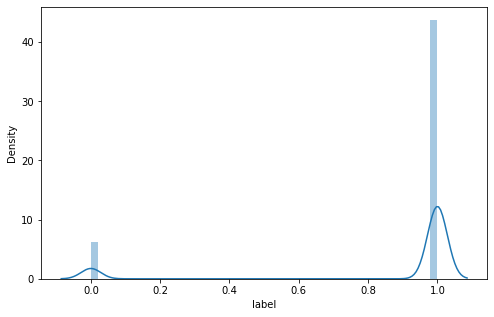

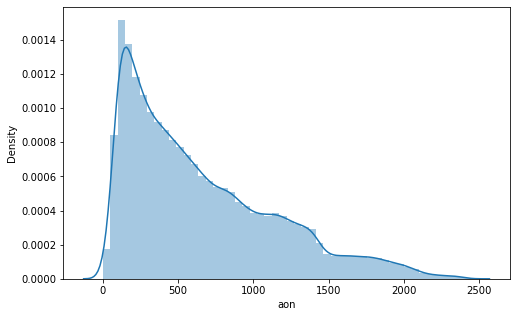

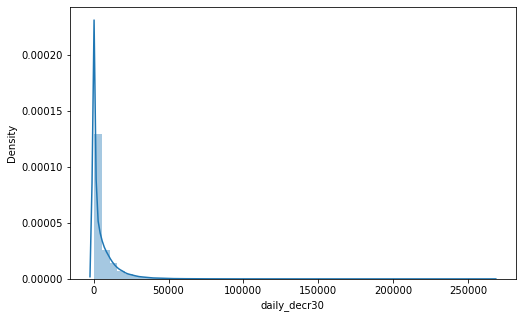

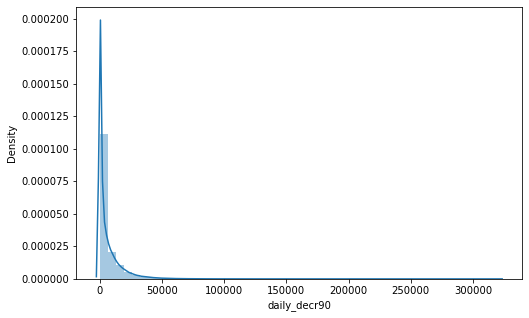

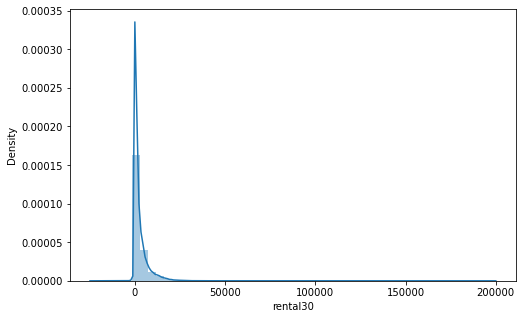

...

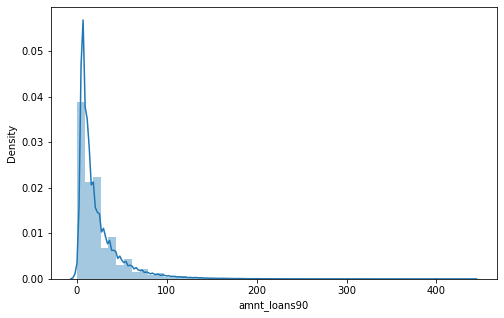

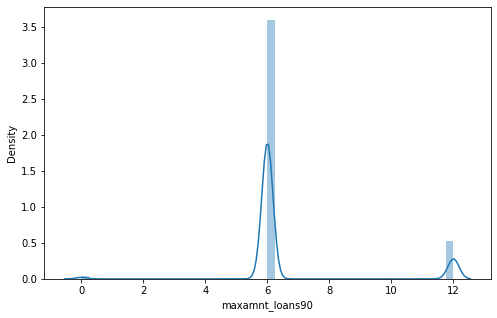

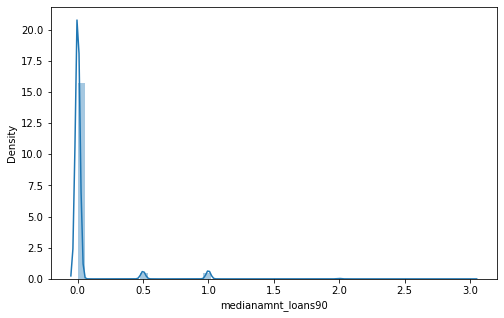

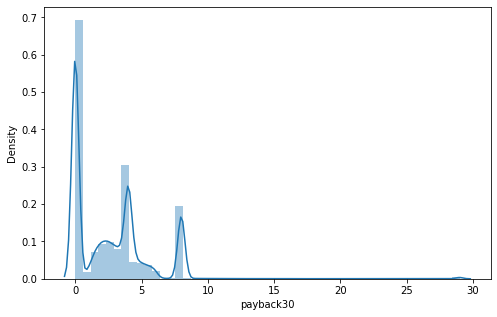

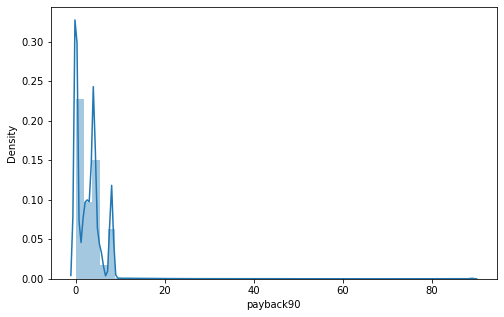

In [106]:
for i in numerical:
    plt.figure(figsize=(8,5))
    sns.distplot(clean_loan[i])
    plt.show()

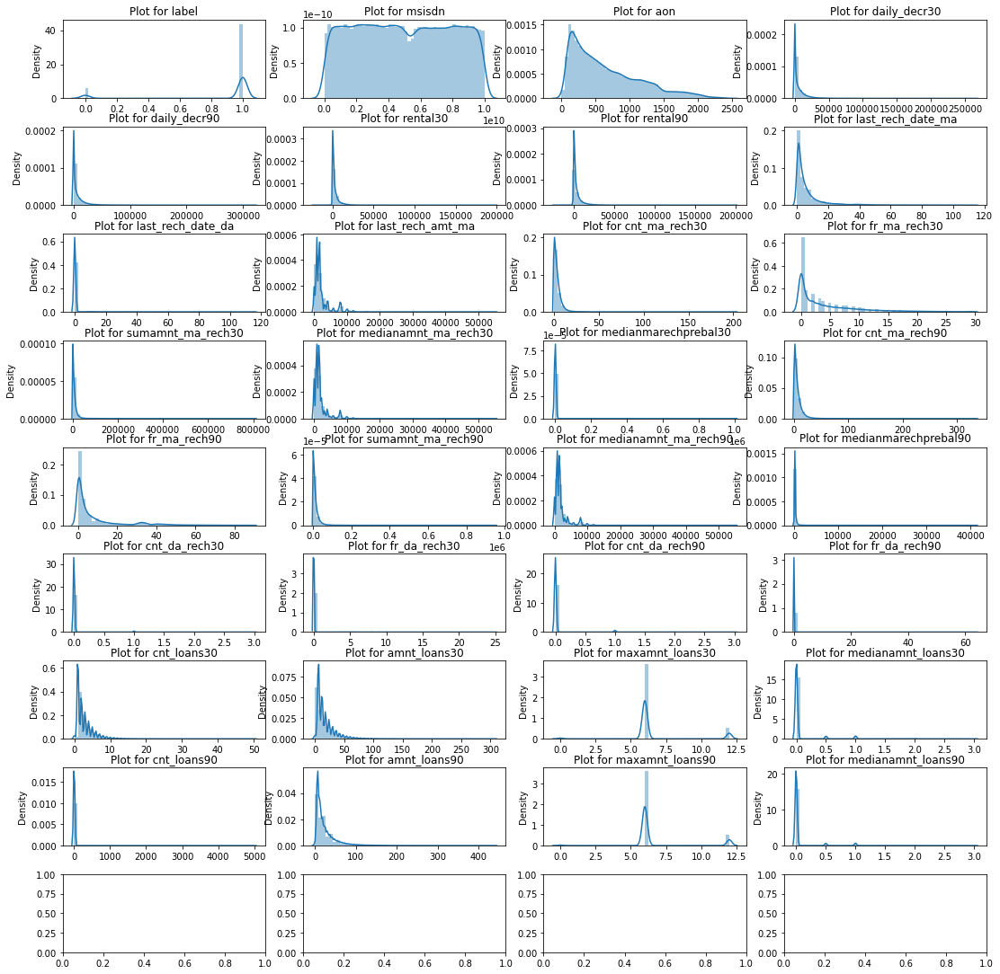

In [107]:
f,ax = plt.subplots(9,4,figsize=(15,15))
f.tight_layout()

i,j = 0,0
for col in clean_loan.iloc[:,:-4].columns:
    graph = sns.distplot(clean_loan[col], ax=ax[i,j])
    graph.set(xlabel=None)
    ax[i,j].set_title(f'Plot for {col}')
    
    j+=1
    if j%4==0:
        i+=1
        j=0

1. After cleaning the data we can see some improvements in the data distribution.
2. The distributions still need to be transformed since some data  are still skewed and need to be scaled.

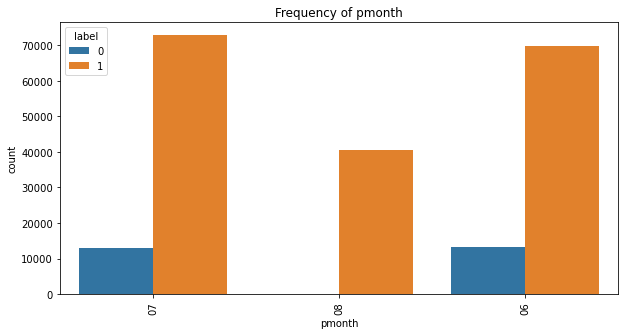

In [108]:
# Visualizing the categorical data

plt.figure(figsize=(10,5))
plt.title(f"Frequency of pmonth")
sns.countplot(clean_loan['pmonth'], hue = clean_loan['label'])
plt.xticks(rotation=90)
plt.show()

1. 6th and 7tyh month have defaulters 
2. 8th month does not have any defaulters

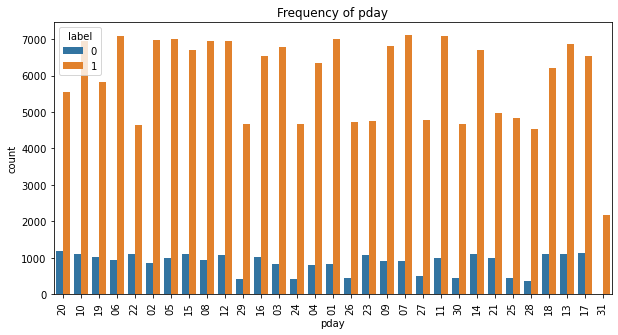

In [109]:
plt.figure(figsize=(10,5))
plt.title(f"Frequency of pday")
sns.countplot(clean_loan['pday'], hue = clean_loan['label'])
plt.xticks(rotation=90)
plt.show()

Almost on all the dates we have defaulters except on 31

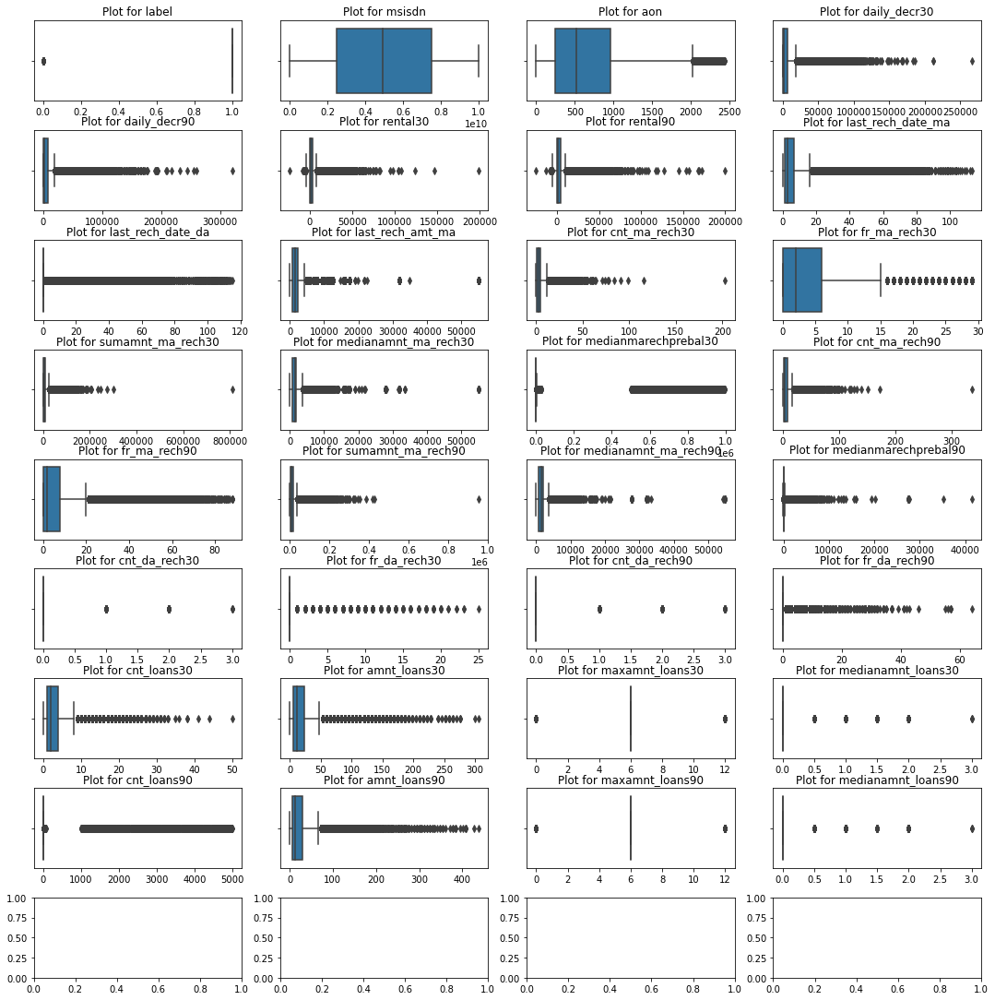

In [110]:
f,ax = plt.subplots(9,4,figsize=(15,15))
f.tight_layout()

i,j = 0,0
for col in clean_loan.iloc[:,:-4].columns:
    graph = sns.boxplot(clean_loan[col], ax=ax[i,j])
    graph.set(xlabel=None)
    ax[i,j].set_title(f'Plot for {col}')
    
    j+=1
    if j%4==0:
        i+=1
        j=0

1. Still some features are showing outliers as we have not treated them keeping in mind that they are not having such restrictions or limitations.
2. But if we compare with the EDA before cleaning we can see much more improvement in data.

In [111]:
clean_loan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209593 entries, 0 to 209592
Data columns (total 36 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   label                 209593 non-null  int64  
 1   msisdn                209593 non-null  int64  
 2   aon                   209593 non-null  int32  
 3   daily_decr30          209593 non-null  float64
 4   daily_decr90          209593 non-null  float64
 5   rental30              209593 non-null  float64
 6   rental90              209593 non-null  float64
 7   last_rech_date_ma     209593 non-null  int32  
 8   last_rech_date_da     209593 non-null  int32  
 9   last_rech_amt_ma      209593 non-null  int64  
 10  cnt_ma_rech30         209593 non-null  int64  
 11  fr_ma_rech30          209593 non-null  int32  
 12  sumamnt_ma_rech30     209593 non-null  float64
 13  medianamnt_ma_rech30  209593 non-null  float64
 14  medianmarechprebal30  209593 non-null  float64
 15  

In [112]:
clean_loan['pmonth'].value_counts()

07    85765
06    83154
08    40674
Name: pmonth, dtype: int64

In [113]:
clean_loan['pday'].value_counts()

11    8092
10    8050
06    8030
12    8028
07    8026
05    7989
13    7969
08    7899
02    7839
01    7824
15    7820
14    7816
09    7717
17    7643
03    7607
16    7556
18    7305
04    7154
19    6857
20    6729
21    5964
23    5816
22    5753
27    5283
25    5269
26    5174
30    5129
24    5103
29    5077
28    4897
31    2178
Name: pday, dtype: int64

In [114]:
# Change the categorical variable into numerical data

from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
clean_loan['pmonth']=le.fit_transform(clean_loan['pmonth'])
clean_loan['pday']=le.fit_transform(clean_loan['pday'])

In [115]:
clean_loan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209593 entries, 0 to 209592
Data columns (total 36 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   label                 209593 non-null  int64  
 1   msisdn                209593 non-null  int64  
 2   aon                   209593 non-null  int32  
 3   daily_decr30          209593 non-null  float64
 4   daily_decr90          209593 non-null  float64
 5   rental30              209593 non-null  float64
 6   rental90              209593 non-null  float64
 7   last_rech_date_ma     209593 non-null  int32  
 8   last_rech_date_da     209593 non-null  int32  
 9   last_rech_amt_ma      209593 non-null  int64  
 10  cnt_ma_rech30         209593 non-null  int64  
 11  fr_ma_rech30          209593 non-null  int32  
 12  sumamnt_ma_rech30     209593 non-null  float64
 13  medianamnt_ma_rech30  209593 non-null  float64
 14  medianmarechprebal30  209593 non-null  float64
 15  

# Now our data is abosolutely clear for further model building

In [116]:
x=clean_loan.drop('label',axis=1)
y=clean_loan['label']

In [117]:
print('x:',x.shape)
print('y:',y.shape)

x: (209593, 35)
y: (209593,)


# Now we will be fiiting the model into different types of classification algorithm as  we have identified

In [118]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=40)

In [119]:
print('X-train shape:',x_train.shape)
print('Y-train shape:',y_train.shape)
print('X-test shape:',x_test.shape)
print('Y-test shape:',y_test.shape)

X-train shape: (167674, 35)
Y-train shape: (167674,)
X-test shape: (41919, 35)
Y-test shape: (41919,)


# Building model with normal algorithm techniques

In [120]:
Logistic=LogisticRegression()
DecisionTree=DecisionTreeClassifier()
NB=GaussianNB()
svc=SVC()

In [121]:
algo=[Logistic,DecisionTree,svc,NB]
acc_models={}
for model in algo:
    model.fit(x_train,y_train)
    y_pred=model.predict(x_test)
    acu_score=accuracy_score(y_test,y_pred)
    print("-"*60)
    acc_models[model]=round(accuracy_score(y_test,y_pred)*100,1)
    print(f"The model {model} has:: \n\t Accuracy :: {round(accuracy_score(y_test,y_pred)*100,1)}% \n\t F1_score is :: {f1_score(y_test,y_pred)} \n\t Classification_Report is :: {classification_report(y_test,y_pred)} \n\t Confusion_matrix is :: {confusion_matrix(y_test,y_pred)}")
    print("-"*60)
    print("\n")

------------------------------------------------------------
The model LogisticRegression() has:: 
	 Accuracy :: 87.5% 
	 F1_score is :: 0.9335758624198637 
	 Classification_Report is ::               precision    recall  f1-score   support

           0       0.00      0.00      0.00      5222
           1       0.88      1.00      0.93     36697

    accuracy                           0.88     41919
   macro avg       0.44      0.50      0.47     41919
weighted avg       0.77      0.88      0.82     41919
 
	 Confusion_matrix is :: [[    0  5222]
 [    0 36697]]
------------------------------------------------------------


------------------------------------------------------------
The model DecisionTreeClassifier() has:: 
	 Accuracy :: 100.0% 
	 F1_score is :: 0.9997683450296383 
	 Classification_Report is ::               precision    recall  f1-score   support

           0       1.00      1.00      1.00      5222
           1       1.00      1.00      1.00     36697

    accura

In [122]:
acc_models

{LogisticRegression(): 87.5,
 DecisionTreeClassifier(): 100.0,
 SVC(): 87.5,
 GaussianNB(): 87.5}

# Ensemble techniques

In [123]:
ada=AdaBoostClassifier()
gdboost=GradientBoostingClassifier()
rfc=RandomForestClassifier()
xg=XGBClassifier()

In [124]:
algo=[ada,gdboost,rfc,xg]
acc_models={}
for model in algo:
    model.fit(x_train,y_train)
    y_pred=model.predict(x_test)
    acu_score=accuracy_score(y_test,y_pred)
    print("-"*60)
    acc_models[model]=round(accuracy_score(y_test,y_pred)*100,1)
    print(f"The model {model} has:: \n\t Accuracy :: {round(accuracy_score(y_test,y_pred)*100,1)}% \n\t F1_score is :: {f1_score(y_test,y_pred)} \n\t Classification_Report is :: {classification_report(y_test,y_pred)} \n\t Confusion_matrix is :: {confusion_matrix(y_test,y_pred)}")
    print("-"*60)
    print("\n")

------------------------------------------------------------
The model AdaBoostClassifier() has:: 
	 Accuracy :: 100.0% 
	 F1_score is :: 0.9999318791809153 
	 Classification_Report is ::               precision    recall  f1-score   support

           0       1.00      1.00      1.00      5222
           1       1.00      1.00      1.00     36697

    accuracy                           1.00     41919
   macro avg       1.00      1.00      1.00     41919
weighted avg       1.00      1.00      1.00     41919
 
	 Confusion_matrix is :: [[ 5217     5]
 [    0 36697]]
------------------------------------------------------------


------------------------------------------------------------
The model GradientBoostingClassifier() has:: 
	 Accuracy :: 100.0% 
	 F1_score is :: 0.9999318791809153 
	 Classification_Report is ::               precision    recall  f1-score   support

           0       1.00      1.00      1.00      5222
           1       1.00      1.00      1.00     36697

    a

Observations:

1. All the models are showing good score. All the Ensemble techniques are performing better than simple models but seems to be overfitted.
2. We will be hypertuning  the simple model for this problem since the simple models are also giving us very good results with low complexity. I am selecting LogisticRegression and DecisionTreeClassifier for hyper parameter tuning since these models are simple and fast.

# Hyper Tuning the Models Logistic Regression

In [125]:
model = LogisticRegression()
solvers = ['newton-cg', 'lbfgs', 'liblinear']
penalty = ['l2']
c_values = [100, 10, 1.0, 0.1, 0.01]
# define grid search
grid = dict(solver=solvers,penalty=penalty,C=c_values)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='roc_auc',error_score=0)
grid_result = grid_search.fit(x_train, y_train)

In [126]:
print('Best_Score:',grid_result.best_score_) 
print('Best_param:',grid_result.best_params_)

Best_Score: 0.878210180412521
Best_param: {'C': 0.01, 'penalty': 'l2', 'solver': 'newton-cg'}


In [127]:
Y_pred_LogRf_best = grid_result.predict(x_test)

# classification Report & Confusion Matix

In [128]:
print('Logistic Regression:')
print('Accuracy score:', round(accuracy_score(y_test, Y_pred_LogRf_best) * 100, 2))
print(classification_report(y_test,Y_pred_LogRf_best))
print("Cofusion matrix:",confusion_matrix(y_test,Y_pred_LogRf_best))

Logistic Regression:
Accuracy score: 87.56
              precision    recall  f1-score   support

           0       0.54      0.01      0.02      5222
           1       0.88      1.00      0.93     36697

    accuracy                           0.88     41919
   macro avg       0.71      0.51      0.48     41919
weighted avg       0.83      0.88      0.82     41919

Cofusion matrix: [[   65  5157]
 [   56 36641]]


The accuracy has increased by 0.06 %.

In [129]:
# ROC curve

#It is a plot of positive rate(x-axis) versus the true positive rate(y-axis) for different threshhold


In [130]:
pred_probability=grid_result.predict_proba(x_test)[:,1]
pred_probability

array([0.99788556, 0.95920463, 0.77172233, ..., 0.84423828, 0.99229014,
       0.65336008])

In [131]:
#fpr = false positive rate
#tpr = true positive rate
fpr,tpr,thresholds=roc_curve(y_test,pred_probability,pos_label=True)
print(fpr)
print("\n")
print(tpr)
print("\n")
print(thresholds)

[0.        0.        0.        ... 0.9998085 1.        1.       ]


[0.         0.00220726 0.00253427 ... 0.99991825 0.99991825 1.        ]


[2.         1.         1.         ... 0.26240593 0.25678125 0.16984498]


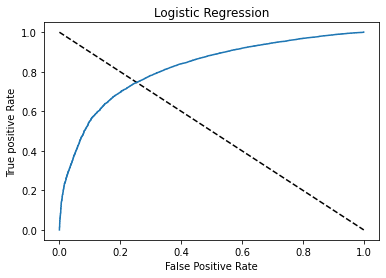

In [132]:
#fpr = false positive rate
#tpr = true positive rate

plt.plot([0,1],[1,0],'k--')
plt.plot(fpr,tpr,label='Logistic Regression')
plt.xlabel('False Positive Rate')
plt.ylabel('True positive Rate')
plt.title('Logistic Regression')
plt.show()

# Now we will be hypertuning our model in order to increase the accuracy

In [133]:
DTC=DecisionTreeClassifier()

In [134]:
#Defining models and parameter
params={'max_leaf_nodes':list(range(2,100)),'min_samples_split':[2,3,4]}

grid_search=GridSearchCV(DecisionTreeClassifier(random_state=42),params,verbose=1,cv=19)

In [135]:
grid_result=grid_search.fit(x_train,y_train)

Fitting 19 folds for each of 294 candidates, totalling 5586 fits


In [136]:
print('Best_Score:',grid_result.best_score_) 
print('Best_param:',grid_result.best_params_)

Best_Score: 0.9997793350231101
Best_param: {'max_leaf_nodes': 3, 'min_samples_split': 2}


In [137]:
Y_pred_DTC_best = grid_result.predict(x_test)

In [138]:
print('Decision Tree Classifier') 
print('Accuracy score:', round(accuracy_score(y_test, Y_pred_DTC_best) * 100, 2))
print(classification_report(y_test,Y_pred_DTC_best))
print("Cofusion matrix:",confusion_matrix(y_test,Y_pred_DTC_best))

Decision Tree Classifier
Accuracy score: 99.99
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5222
           1       1.00      1.00      1.00     36697

    accuracy                           1.00     41919
   macro avg       1.00      1.00      1.00     41919
weighted avg       1.00      1.00      1.00     41919

Cofusion matrix: [[ 5217     5]
 [    0 36697]]


In [139]:
# ROC curve

#It is a plot of positive rate(x-axis) versus the true positive rate(y-axis) for different threshhold

In [140]:
pred_probability=grid_result.predict_proba(x_test)[:,1]
pred_probability

array([0.99974791, 0.        , 0.99974791, ..., 0.99974791, 0.99974791,
       0.        ])

In [141]:
fpr,tpr,thresholds=roc_curve(y_test,pred_probability,pos_label=True)
print(fpr)
print("\n")
print(tpr)
print("\n")
print(thresholds)

[0.00000000e+00 9.57487553e-04 1.00000000e+00]


[0. 1. 1.]


[1.99974791 0.99974791 0.        ]


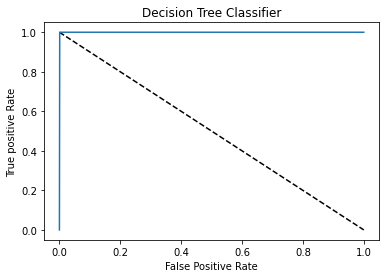

In [142]:
plt.plot([0,1],[1,0],'k--')
plt.plot(fpr,tpr,label='Decision Tree Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True positive Rate')
plt.title('Decision Tree Classifier')
plt.show()

The accuracy has decreased fromm 100% to 99.99%.

In [143]:
import pickle

In [144]:
filename='Micro_credit.pkl'
pickle.dump(DTC,open(filename,'wb'))

Observation:
    
1. After cleaning the payback variables show pretty good difference between labels 0 and 1.

2. On an average, the time taken by defaulters to pay back the loan is greater than the time taken by non-defaulter to pay back the loan over a period of 30 or 90.

3. Chosen Decision Tree Classifier Algorithm with 99.99% accuracy as my best model.

4. Choose the final model based on weighted ROC-AUC curve and confusion metrics.
